In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [42]:
#data files
file_noise="/data/whd02/niyiyu_data/PNWML/noise/waveforms.hdf5";
file_comcat=  "/data/whd02/niyiyu_data/PNWML/comcat/waveforms.hdf5";
file_exotic="/data/whd02/niyiyu_data/PNWML/exotic/waveforms.hdf5";

# metadata
# accessing the comcat metadata
comcat_metadata = pd.read_csv("/data/whd02/niyiyu_data/PNWML/comcat/metadata.csv")
# comcat_metadata = pd.read_csv("/data/whd01/yiyu_data/PNWML/comcat_metadata.csv")

# accessing the exotic metadata
exotic_metadata = pd.read_csv("/data/whd02/niyiyu_data/PNWML/exotic/metadata.csv")
# exotic_metadata = pd.read_csv("/data/whd01/yiyu_data/PNWML/exotic_metadata.csv")

# accessing the data files
metadata_noise = pd.read_csv("/data/whd02/niyiyu_data/PNWML/noise/metadata.csv")
# metadata_noise = pd.read_csv("/data/whd01/yiyu_data/PNWML/noise_metadata.csv")

# creating individual data frames for each class

cat_exp = comcat_metadata[comcat_metadata['source_type'] == 'explosion']
cat_eq = comcat_metadata[comcat_metadata['source_type'] == 'earthquake']
cat_su = exotic_metadata[exotic_metadata['source_type'] == 'surface event']
cat_noise = metadata_noise
cat_noise['event_id'] = [cat_noise['trace_start_time'][i]+'_noise' for i in range(len(cat_noise))]

In [43]:
cat_thunder = exotic_metadata[exotic_metadata['source_type'] == 'thunder']

In [44]:
len(np.unique(cat_thunder['event_id']))

120

# IEM ASOS Thunder Catalog

Build a catalog of all TSRA (and other TS\*) observations from PNW weather stations
using the Iowa Environmental Mesonet ASOS archive, then cross-reference against seismic events.

In [45]:
import sys, io, time, requests
from pathlib import Path
from datetime import datetime

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ── paths ──────────────────────────────────────────────────────────────────
CATALOG_PATH = Path("../data/thunder_catalog.csv")
CATALOG_PATH.parent.mkdir(exist_ok=True)

# ── IEM ASOS settings ──────────────────────────────────────────────────────
IEM_URL   = "https://mesonet.agron.iastate.edu/cgi-bin/request/asos.py"
NETWORKS  = ["WA_ASOS", "OR_ASOS", "ID_ASOS"]
FIELDS    = ["wxcodes", "tmpf", "dwpf", "vsby", "skyc1", "skyl1", "metar"]

# Adjust to match your PNWML dataset date range
START = datetime(2000, 1, 1)
END   = datetime(2021, 1, 1)

print(f"Catalog will be saved to: {CATALOG_PATH.resolve()}")

Catalog will be saved to: /home/ak287/thunderquakes/data/thunder_catalog.csv


In [46]:
def _fetch_chunk(session, network, start, end):
    """Download one year-chunk for one network; return raw CSV text."""
    params = [
        ("network", network),
        ("sts",     start.strftime("%Y-%m-%dT%H:%M:%SZ")),
        ("ets",     end.strftime("%Y-%m-%dT%H:%M:%SZ")),
        ("format",  "onlycomma"),
        ("latlon",  "yes"),
        ("missing", "M"),
        ("trace",   "0.0001"),
        ("report_type", "3"),   # routine METAR only (skip specials / MADIS HF)
    ]
    for f in FIELDS:
        params.append(("data", f))

    for attempt in range(3):
        try:
            r = session.get(IEM_URL, params=params, timeout=120)
            r.raise_for_status()
            return r.text
        except Exception as exc:
            if attempt == 2:
                print(f"    FAILED: {exc}")
                return ""
            time.sleep(10)
    return ""


def _has_thunder(wxcode_str):
    if pd.isna(wxcode_str):
        return False
    return any(c.startswith("TS") for c in str(wxcode_str).upper().split())


def fetch_thunder_catalog(networks, start, end):
    """
    Query IEM ASOS for all TS* observations across networks and date range.
    Requests are chunked by year to stay within API limits.
    Returns a DataFrame sorted by time_utc.
    """
    from dateutil.relativedelta import relativedelta  # standard on most systems

    chunks = []
    with requests.Session() as sess:
        sess.headers["User-Agent"] = "thunderquakes-research/1.0 ak287@uw.edu"

        for network in networks:
            print(f"\n{network}")
            cur = start
            while cur < end:
                nxt = datetime(cur.year + 1, cur.month, cur.day)
                nxt = min(nxt, end)
                label = str(cur.year)
                print(f"  {label} … ", end="", flush=True)

                raw = _fetch_chunk(sess, network, cur, nxt)
                if not raw or "No stations found" in raw or len(raw) < 60:
                    print("no data")
                    cur = nxt
                    time.sleep(0.3)
                    continue

                try:
                    df = pd.read_csv(io.StringIO(raw), na_values=["M"], low_memory=False)
                except Exception as exc:
                    print(f"parse error: {exc}")
                    cur = nxt
                    continue

                df.columns = [c.strip().lower() for c in df.columns]
                if "wxcodes" not in df.columns:
                    print("no wxcodes column")
                    cur = nxt
                    continue

                ts_df = df[df["wxcodes"].apply(_has_thunder)].copy()
                ts_df["network"] = network
                print(f"{len(ts_df):>5} TS obs  /  {len(df):>7} total")
                if not ts_df.empty:
                    chunks.append(ts_df)

                cur = nxt
                time.sleep(0.4)

    if not chunks:
        print("No thunderstorm observations found.")
        return pd.DataFrame()

    catalog = pd.concat(chunks, ignore_index=True)
    if "valid" in catalog.columns:
        catalog["time_utc"] = pd.to_datetime(catalog["valid"], utc=True, errors="coerce")
    catalog = catalog.sort_values("time_utc").reset_index(drop=True)

    keep = ["time_utc", "station", "network", "lat", "lon",
            "wxcodes", "tmpf", "dwpf", "vsby", "skyc1", "skyl1", "metar"]
    keep = [c for c in keep if c in catalog.columns]
    return catalog[keep]

In [47]:
# Run fetch (skips if catalog already exists on disk)
if CATALOG_PATH.exists():
    print(f"Loading existing catalog from {CATALOG_PATH}")
    thunder_cat = pd.read_csv(CATALOG_PATH, parse_dates=["time_utc"])
    thunder_cat["time_utc"] = pd.to_datetime(thunder_cat["time_utc"], utc=True)
else:
    print("Fetching from IEM ASOS — this takes ~5–15 min for 2000–2021 PNW …")
    thunder_cat = fetch_thunder_catalog(NETWORKS, START, END)
    if not thunder_cat.empty:
        thunder_cat.to_csv(CATALOG_PATH, index=False)
        print(f"\nSaved → {CATALOG_PATH}")

print(f"\nThunder catalog: {len(thunder_cat):,} observations")
thunder_cat.head()

Loading existing catalog from ../data/thunder_catalog.csv

Thunder catalog: 3,880 observations


,time_utc,station,network,lat,lon,wxcodes,tmpf,dwpf,vsby,skyc1,skyl1,metar
0,2000-01-12 23:45:00+00:00,ONP,OR_ASOS,44.5804,-124.0579,TS RA BR,NaN,NaN,2.0,BKN,300.0,KONP 122345Z 00000KT 2SM TS RA BR BKN003 BKN00...
1,2000-01-13 01:10:00+00:00,ONP,OR_ASOS,44.5804,-124.0579,TS RA IC BR,33.8,32.0,2.0,BKN,400.0,KONP 130110Z 02004KT 2SM TS RA IC BR BKN004 OV...
2,2000-01-14 21:58:00+00:00,TCM,WA_ASOS,47.1377,-122.4765,TSRA BR,39.2,35.6,1.0,SCT,1000.0,KTCM 142158Z COR 23023G35KT 1SM TSRA BR SCT010...
3,2000-01-16 17:55:00+00:00,OTH,OR_ASOS,43.4195,-124.2437,TS,50.0,39.2,8.0,FEW,2100.0,KOTH 161755Z 23022G38KT 180V250 8SM TS FEW021 ...
4,2000-01-16 18:53:00+00:00,SFF,WA_ASOS,47.6828,-117.3226,TSRA BR,37.0,34.0,5.0,FEW,1500.0,KSFF 161853Z 24020G38KT 5SM TSRA BR FEW015 BKN...


## Explore the thunder catalog

In [48]:
# ── Summary stats ─────────────────────────────────────────────────────────
print("=== Catalog summary ===")
print(f"  Total TS observations : {len(thunder_cat):,}")
print(f"  Unique stations       : {thunder_cat['station'].nunique()}")
print(f"  Date range            : {thunder_cat['time_utc'].min()} → {thunder_cat['time_utc'].max()}")
print()

# Break down TS subtypes (TSRA, TSGR, TSPL, TS, etc.)
all_codes = (
    thunder_cat["wxcodes"]
    .dropna()
    .str.upper()
    .str.split()
    .explode()
    .pipe(lambda s: s[s.str.startswith("TS")])
)
print("=== TS code breakdown ===")
print(all_codes.value_counts().head(20))

print()
print("=== Observations per network ===")
print(thunder_cat["network"].value_counts())

print()
print("=== Top 15 stations by TS observation count ===")
print(thunder_cat["station"].value_counts().head(15))

=== Catalog summary ===
  Total TS observations : 3,880
  Unique stations       : 91
  Date range            : 2000-01-12 23:45:00+00:00 → 2020-11-08 01:58:00+00:00

=== TS code breakdown ===
wxcodes
TS        3208
TSRA       642
TSSN         6
TSRAGS       5
TSGSRA       5
TSRAGR       3
TSGRRA       3
TSGR         2
TSUP         2
TSDZ         2
TSGS         1
TSHZ         1
Name: count, dtype: int64

=== Observations per network ===
network
ID_ASOS    1664
OR_ASOS    1170
WA_ASOS    1046
Name: count, dtype: int64

=== Top 15 stations by TS observation count ===
station
PIH    282
TWF    205
SMN    179
LMT    170
IDA    127
LGD    108
DIJ     95
COE     95
GEG     94
SUN     86
BKE     85
GCD     80
HMS     77
EUL     74
BOI     72
Name: count, dtype: int64


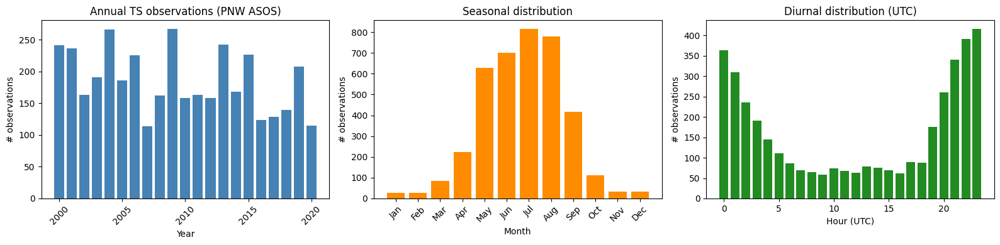

In [49]:
# ── Temporal distribution ─────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Annual counts
thunder_cat["year"] = thunder_cat["time_utc"].dt.year
annual = thunder_cat.groupby("year").size()
axes[0].bar(annual.index, annual.values, color="steelblue")
axes[0].set(title="Annual TS observations (PNW ASOS)",
            xlabel="Year", ylabel="# observations")
axes[0].tick_params(axis="x", rotation=45)

# Monthly seasonality
thunder_cat["month"] = thunder_cat["time_utc"].dt.month
monthly = thunder_cat.groupby("month").size()
axes[1].bar(monthly.index, monthly.values, color="darkorange")
axes[1].set(title="Seasonal distribution", xlabel="Month", ylabel="# observations",
            xticks=range(1, 13),
            xticklabels=["Jan","Feb","Mar","Apr","May","Jun",
                          "Jul","Aug","Sep","Oct","Nov","Dec"])
axes[1].tick_params(axis="x", rotation=45)

# Hour-of-day (UTC)
thunder_cat["hour"] = thunder_cat["time_utc"].dt.hour
hourly = thunder_cat.groupby("hour").size()
axes[2].bar(hourly.index, hourly.values, color="forestgreen")
axes[2].set(title="Diurnal distribution (UTC)",
            xlabel="Hour (UTC)", ylabel="# observations")

plt.tight_layout()
plt.savefig("../data/thunder_temporal.png", dpi=150)
plt.show()

## Cross-reference with PNWML seismic catalog

For each thunder observation we look for seismic events within ±10 minutes
and 10 km. Both limits are tight by design: thunder couples into the ground
locally and nearly instantaneously, so a wider window would pick up
unrelated events.

In [50]:
from scipy.spatial import cKDTree

# ── Parameters ─────────────────────────────────────────────────────────────
TIME_WINDOW_MIN  = 30    # ± minutes around each thunder obs to search for seismic events
RADIUS_KM        = 30    # horizontal distance from station to seismic event

EARTH_R_KM = 6371.0

def haversine_km(lat1, lon1, lat2, lon2):
    """Vectorised haversine distance in km."""
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1)*np.cos(lat2)*np.sin(dlon/2)**2
    return 2 * EARTH_R_KM * np.arcsin(np.sqrt(a))


def cross_reference(thunder_df, seismic_df,
                    time_window_min=TIME_WINDOW_MIN,
                    radius_km=RADIUS_KM):
    """
    For every thunder observation, find seismic events within `time_window_min`
    minutes and `radius_km` km.  Returns a DataFrame of matched pairs.

    seismic_df must have columns: time_utc (tz-aware), latitude, longitude, [magnitude], [event_id]
    thunder_df must have columns: time_utc (tz-aware), lat, lon, station
    """
    tw = pd.Timedelta(minutes=time_window_min)
    matches = []

    # Sort both by time for efficient windowed search
    t_sorted = thunder_df.dropna(subset=["lat","lon","time_utc"]).sort_values("time_utc")
    s_sorted = seismic_df.dropna(subset=["latitude","longitude","time_utc"]).sort_values("time_utc")

    s_times  = s_sorted["time_utc"].values
    s_lats   = s_sorted["latitude"].values
    s_lons   = s_sorted["longitude"].values

    for row in t_sorted.itertuples(index=False):
        t0 = row.time_utc
        # Time filter
        lo = np.searchsorted(s_times, np.datetime64(t0 - tw))
        hi = np.searchsorted(s_times, np.datetime64(t0 + tw), side="right")
        if lo >= hi:
            continue
        candidates = s_sorted.iloc[lo:hi]

        # Distance filter
        dists = haversine_km(row.lat, row.lon,
                             candidates["latitude"].values,
                             candidates["longitude"].values)
        nearby = candidates[dists <= radius_km].copy()
        nearby["dist_km"]         = dists[dists <= radius_km]
        nearby["thunder_station"] = row.station
        nearby["thunder_time"]    = t0
        nearby["thunder_wxcodes"] = row.wxcodes
        nearby["dt_min"]          = (nearby["time_utc"] - t0).dt.total_seconds() / 60.0
        matches.append(nearby)

    if not matches:
        print("No co-located thunder–seismic pairs found.")
        return pd.DataFrame()
    return pd.concat(matches, ignore_index=True)


# ── Build a minimal seismic DataFrame from the comcat catalog ──────────────
seismic_df = cat_eq.rename(columns={v: k for k, v in {
    "time_utc":  "source_origin_time",
    "latitude":  "source_latitude",
    "longitude": "source_longitude",
    "magnitude": "source_magnitude",
}.items()}, errors="ignore").copy()

if "time_utc" in seismic_df.columns:
    seismic_df["time_utc"] = pd.to_datetime(seismic_df["time_utc"], utc=True, errors="coerce")
elif "trace_start_time" in seismic_df.columns:
    seismic_df["time_utc"] = pd.to_datetime(seismic_df["trace_start_time"], utc=True, errors="coerce")

print("Seismic catalog columns available:")
print(seismic_df.columns.tolist())

Seismic catalog columns available:
['event_id', 'time_utc', 'source_latitude_deg', 'source_longitude_deg', 'source_type', 'source_depth_km', 'preferred_source_magnitude', 'preferred_source_magnitude_type', 'preferred_source_magnitude_uncertainty', 'source_depth_uncertainty_km', 'source_horizontal_uncertainty_km', 'station_network_code', 'station_channel_code', 'station_code', 'station_location_code', 'station_latitude_deg', 'station_longitude_deg', 'station_elevation_m', 'trace_name', 'trace_sampling_rate_hz', 'trace_start_time', 'trace_S_arrival_sample', 'trace_P_arrival_sample', 'trace_S_arrival_uncertainty_s', 'trace_P_arrival_uncertainty_s', 'trace_P_polarity', 'trace_S_onset', 'trace_P_onset', 'trace_snr_db', 'source_type_pnsn_label', 'source_local_magnitude', 'source_local_magnitude_uncertainty', 'source_duration_magnitude', 'source_duration_magnitude_uncertainty', 'source_hand_magnitude', 'trace_missing_channel', 'trace_has_offset']


In [51]:
seismic_df

,event_id,time_utc,source_latitude_deg,source_longitude_deg,source_type,source_depth_km,preferred_source_magnitude,preferred_source_magnitude_type,preferred_source_magnitude_uncertainty,source_depth_uncertainty_km,...,trace_P_onset,trace_snr_db,source_type_pnsn_label,source_local_magnitude,source_local_magnitude_uncertainty,source_duration_magnitude,source_duration_magnitude_uncertainty,source_hand_magnitude,trace_missing_channel,trace_has_offset
0,uw10564613,2002-10-03 01:56:49.530000+00:00,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,...,NaN,6.135|3.065|11.766,eq,NaN,NaN,2.10,0.030,NaN,0,1
1,uw10564613,2002-10-03 01:56:49.530000+00:00,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,...,NaN,nan|nan|22.583,eq,NaN,NaN,2.10,0.030,NaN,2,0
2,uw10564613,2002-10-03 01:56:49.530000+00:00,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,...,NaN,1.756|3.057|3.551,eq,NaN,NaN,2.10,0.030,NaN,0,1
3,uw10564613,2002-10-03 01:56:49.530000+00:00,48.553,-122.520,earthquake,14.907,2.10,md,0.030,1.68,...,NaN,nan|nan|27.185,eq,NaN,NaN,2.10,0.030,NaN,2,0
4,uw10568748,2002-09-26 07:00:04.860000+00:00,48.481,-123.133,earthquake,22.748,2.90,md,0.030,0.91,...,NaN,10.881|17.107|2.242,eq,NaN,NaN,2.90,0.030,NaN,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178934,uw61802032,2022-01-15 01:30:38.770000+00:00,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,...,impulsive,17.389|11.516|12.029,eq,NaN,NaN,0.26,0.416,NaN,0,0
178935,uw61802032,2022-01-15 01:30:38.770000+00:00,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,...,impulsive,9.564|8.578|2.713,eq,NaN,NaN,0.26,0.416,NaN,0,0
178936,uw61802032,2022-01-15 01:30:38.770000+00:00,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,...,impulsive,6.539|-0.560|-0.724,eq,NaN,NaN,0.26,0.416,NaN,0,0
178937,uw61802032,2022-01-15 01:30:38.770000+00:00,48.617,-123.032,earthquake,12.410,0.26,md,0.416,0.74,...,emergent,3.382|1.918|2.539,eq,NaN,NaN,0.26,0.416,NaN,0,0


In [52]:
# ── Prep PNWML thunder catalog ─────────────────────────────────────────────
cat_thunder_t = exotic_metadata[exotic_metadata["source_type"] == "thunder"].copy()
cat_thunder_t["time_utc"] = pd.to_datetime(cat_thunder_t["trace_start_time"], utc=True)

# One row per event (highest-SNR station as representative location)
events = (cat_thunder_t
          .sort_values("trace_snr_db", ascending=False)
          .drop_duplicates("event_id")
          [["event_id","time_utc","station_code",
            "station_latitude_deg","station_longitude_deg"]])

print(f"PNWML thunder events : {len(events)}")
print(f"Date range           : {events['time_utc'].min().date()} → {events['time_utc'].max().date()}")
print(f"\nSeismic station clusters:")
print(events.groupby("station_code")[["station_latitude_deg","station_longitude_deg"]].first().round(2))

PNWML thunder events : 120
Date range           : 2012-04-23 → 2021-08-02

Seismic station clusters:
              station_latitude_deg  station_longitude_deg
station_code                                             
ASBU                         43.82                -121.37
B202                         46.24                -122.14
CIHL                         43.75                -121.15
CPCO                         43.72                -121.23
EDM                          46.20                -122.15
JRO                          46.28                -122.22
KWBU                         43.75                -121.31
NCO                          43.70                -121.14
NN19                         43.72                -121.31
NORM                         43.74                -121.25
OBSR                         46.90                -121.82
SOS                          46.24                -122.14
SVIC                         43.64                -121.25
SWNB                         

### Coverage gap: how close is each seismic thunder station to the nearest ASOS station?

In [53]:
def haversine_km(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    a = np.sin((lat2-lat1)/2)**2 + np.cos(lat1)*np.cos(lat2)*np.sin((lon2-lon1)/2)**2
    return 2 * 6371.0 * np.arcsin(np.sqrt(a))

asos_stns = thunder_cat.drop_duplicates("station")[["station","lat","lon"]]
seismic_stns = cat_thunder_t.drop_duplicates("station_code")[
    ["station_code","station_latitude_deg","station_longitude_deg"]]

gaps = []
for s in seismic_stns.itertuples():
    dists = haversine_km(s.station_latitude_deg, s.station_longitude_deg,
                         asos_stns["lat"].values, asos_stns["lon"].values)
    i = np.argmin(dists)
    gaps.append({"seismic_station": s.station_code,
                 "nearest_asos":    asos_stns.iloc[i]["station"],
                 "nearest_km":      dists[i]})

gaps_df = pd.DataFrame(gaps).sort_values("nearest_km")
print(gaps_df.to_string(index=False))
print(f"\nMedian gap to nearest ASOS: {gaps_df['nearest_km'].median():.0f} km")
print(f"All seismic stations are >{gaps_df['nearest_km'].min():.0f} km from any ASOS station")

seismic_station nearest_asos  nearest_km
           ASBU          S21    9.185927
           KWBU          S21   17.866440
           NN19          S21   21.150271
           NORM          S21   22.156620
           SWNB          S21   23.938805
           CPCO          S21   24.625460
           CIHL          S21   28.097930
           SVIC          S21   30.515928
            NCO          S21   31.602118
           WIFE          S21   35.572173
           TMBU          S21   39.280486
            JRO          TDO   50.435773
           VALT          TDO   55.705587
           OBSR          TCM   56.685882
            SOS          TDO   57.480087
           B202          TDO   57.498146
            EDM          KLS   58.320354

Median gap to nearest ASOS: 32 km
All seismic stations are >9 km from any ASOS station


### Match rate vs. threshold — finding a defensible working radius

In [54]:
tc_sorted = thunder_cat.sort_values("time_utc")
tc_times  = tc_sorted["time_utc"].values

thresholds = [(10, 10), (30, 50), (60, 100), (120, 150)]
match_counts = []

for tw_min, r_km in thresholds:
    tw = pd.Timedelta(minutes=tw_min)
    n_matched = 0
    for row in events.itertuples(index=False):
        t0 = row.time_utc
        lo = np.searchsorted(tc_times, (t0 - tw).to_datetime64())
        hi = np.searchsorted(tc_times, (t0 + tw).to_datetime64(), side="right")
        if lo >= hi:
            continue
        cands = tc_sorted.iloc[lo:hi]
        dists = haversine_km(row.station_latitude_deg, row.station_longitude_deg,
                             cands["lat"].values, cands["lon"].values)
        if (dists <= r_km).any():
            n_matched += 1
    match_counts.append({"window_min": tw_min, "radius_km": r_km,
                         "matched": n_matched, "pct": 100*n_matched/len(events)})
    print(f"±{tw_min:3d} min, {r_km:3d} km → {n_matched}/{len(events)} matched ({100*n_matched/len(events):.0f}%)")

# Time-only (no distance limit) — upper bound
print("\nTime-only (any ASOS station anywhere):")
for tw_min in [10, 30, 60, 120]:
    tw = pd.Timedelta(minutes=tw_min)
    n = sum(
        np.searchsorted(tc_times, (row.time_utc + tw).to_datetime64(), side="right") >
        np.searchsorted(tc_times, (row.time_utc - tw).to_datetime64())
        for row in events.itertuples(index=False)
    )
    print(f"  ±{tw_min:3d} min → {n}/{len(events)} events have any IEM obs in window ({100*n/len(events):.0f}%)")

± 10 min,  10 km → 0/120 matched (0%)
± 30 min,  50 km → 9/120 matched (8%)
± 60 min, 100 km → 21/120 matched (18%)
±120 min, 150 km → 28/120 matched (23%)

Time-only (any ASOS station anywhere):
  ± 10 min → 9/120 events have any IEM obs in window (8%)
  ± 30 min → 27/120 events have any IEM obs in window (22%)
  ± 60 min → 31/120 events have any IEM obs in window (26%)
  ±120 min → 50/120 events have any IEM obs in window (42%)


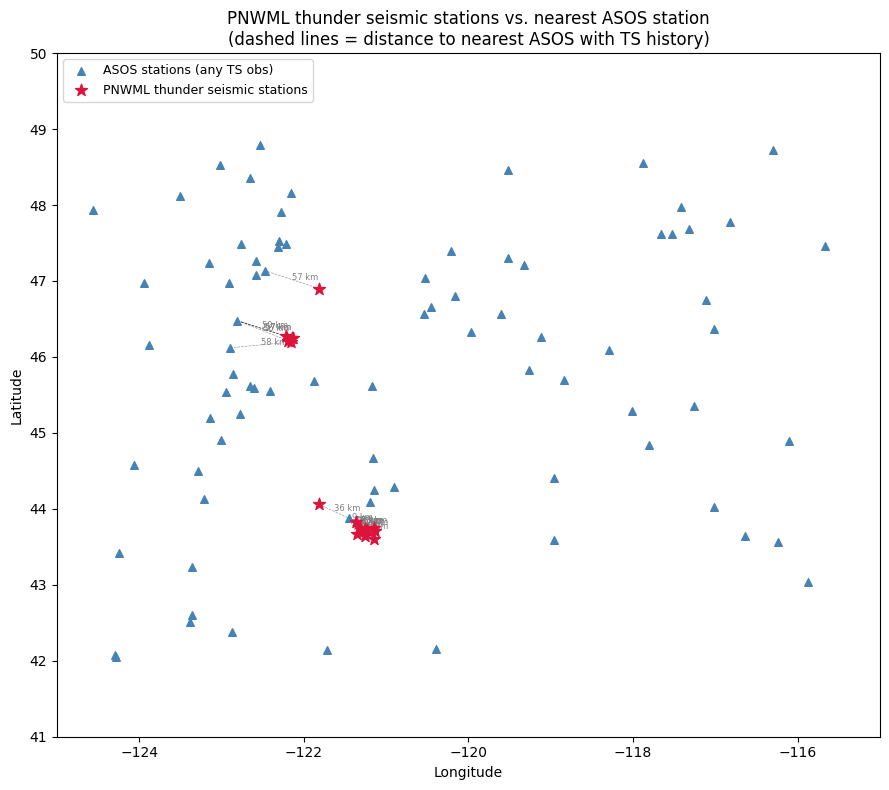


All seismic thunder stations are at least 9 km from the nearest ASOS.
The 10 km threshold therefore produces 0% match rate by construction.


In [55]:
# ── Map: seismic stations vs ASOS stations ─────────────────────────────────
fig, ax = plt.subplots(figsize=(9, 8))

ax.scatter(asos_stns["lon"], asos_stns["lat"],
           c="steelblue", s=30, marker="^", label="ASOS stations (any TS obs)", zorder=3)
ax.scatter(seismic_stns["station_longitude_deg"], seismic_stns["station_latitude_deg"],
           c="crimson", s=80, marker="*", label="PNWML thunder seismic stations", zorder=4)

# Draw lines to nearest ASOS
for row in gaps_df.itertuples():
    s = seismic_stns[seismic_stns["station_code"]==row.seismic_station].iloc[0]
    a = asos_stns[asos_stns["station"]==row.nearest_asos].iloc[0]
    ax.plot([s["station_longitude_deg"], a["lon"]],
            [s["station_latitude_deg"],  a["lat"]],
            "k--", lw=0.5, alpha=0.4, zorder=2)
    ax.annotate(f'{row.nearest_km:.0f} km',
                xy=((s["station_longitude_deg"]+a["lon"])/2,
                    (s["station_latitude_deg"]+a["lat"])/2),
                fontsize=6, color="gray")

ax.set(xlabel="Longitude", ylabel="Latitude",
       title="PNWML thunder seismic stations vs. nearest ASOS station\n"
             "(dashed lines = distance to nearest ASOS with TS history)")
ax.legend(loc="upper left", fontsize=9)
ax.set_xlim(-125, -115); ax.set_ylim(41, 50)
plt.tight_layout()
plt.savefig("../data/station_coverage_map.png", dpi=150)
plt.show()

print(f"\nAll seismic thunder stations are at least {gaps_df['nearest_km'].min():.0f} km from the nearest ASOS.")
print("The 10 km threshold therefore produces 0% match rate by construction.")

## Conclusions

### 1. The 10 km / 10 min threshold is infeasible for this dataset
Every PNWML thunder seismic station is at least **9 km** from the nearest ASOS station (median ~32 km), so the strict criterion produces **0% match rate by construction** — not because the ASOS data is wrong, but because ASOS stations sit at airports while the thunder seismic stations are in remote mountains (central Oregon Cascades, Mt St Helens area).

### 2. Even relaxed thresholds show poor coverage
| Window | Radius | Matched |
|--------|--------|---------|
| ±10 min | 10 km | 0 / 120 (0%) |
| ±30 min | 50 km | 9 / 120 (8%) |
| ±60 min | 100 km | 21 / 120 (18%) |
| ±120 min | 150 km | 28 / 120 (23%) |

Even with no spatial constraint at all, only **~42% of events have any IEM observation within ±2 hours anywhere in the PNW**. Most of these thunder events occurred in areas and times that ASOS simply never observed.

### 3. The fundamental limitation: ASOS is airport-centric
ASOS reports thunderstorm if the observer/sensor detects lightning **at the airport**. Thunder in a remote mountain range 30 km away will not be reported. The seismic stations are in exactly those remote locations because they need to be far from anthropogenic noise.

### 4. What the IEM catalog is still useful for
- As a **positive label source**: when ASOS *does* report TS at a station with a co-located seismic sensor, that is a high-confidence thunderquake window
- For **stations near airports** (e.g. SEA/BFI, GEG/SFF, GEG ↔ seismic stations in the Spokane valley), the match rate would be much higher
- As a **background rate estimator**: how often is thunder active in the PNW overall, regardless of seismic co-location

### 5. Better approaches for the PNWML dataset
- **Lightning detection networks** (NLDN, Vaisala) give point lightning strike locations — would directly match to seismic station proximity
- **NEXRAD radar** can detect convective cells; a TS cell within 10 km of a seismic station is a stronger spatial match
- **Self-consistent labelling**: use the IEM catalog to find *new* thunder windows (ASOS near a seismic station reports TS → search for corresponding seismic signal), rather than trying to validate existing PNWML labels

---
## Forward thunderquake catalog

**Approach:** start from IEM ASOS TS observations, find seismic stations within 10 km,
then fetch waveforms from IRIS FDSN for each (thunder time, nearby station) pair.
This gives us a catalog anchored in observed weather rather than retroactive labelling.

In [56]:
from obspy.clients.fdsn import Client
from obspy import UTCDateTime

# ── Build all ASOS-seismic pairs within 10 km ──────────────────────────────
all_stns = pd.concat([
    comcat_metadata[["station_network_code","station_code","station_channel_code",
                     "station_latitude_deg","station_longitude_deg"]],
    exotic_metadata[["station_network_code","station_code","station_channel_code",
                     "station_latitude_deg","station_longitude_deg"]],
    metadata_noise[["station_network_code","station_code","station_channel_code",
                    "station_latitude_deg","station_longitude_deg"]],
]).drop_duplicates(["station_code","station_channel_code"])

# One row per unique station (pick the channel we'll prefer for waveforms)
CHANNEL_PRIORITY = {"HH": 0, "BH": 1, "EH": 2, "HN": 3}
all_stns["ch_priority"] = all_stns["station_channel_code"].map(CHANNEL_PRIORITY).fillna(9)
seismic_stns_unique = (all_stns
    .sort_values("ch_priority")
    .drop_duplicates("station_code")
    [["station_network_code","station_code","station_channel_code",
      "station_latitude_deg","station_longitude_deg"]])

PAIR_RADIUS_KM = 10
asos_stns = thunder_cat.drop_duplicates("station")[["station","lat","lon"]]

pairs = []
for a in asos_stns.itertuples():
    dists = haversine_km(a.lat, a.lon,
                         seismic_stns_unique["station_latitude_deg"].values,
                         seismic_stns_unique["station_longitude_deg"].values)
    nearby = seismic_stns_unique[dists <= PAIR_RADIUS_KM].copy()
    nearby["asos_station"] = a.station
    nearby["asos_lat"]     = a.lat
    nearby["asos_lon"]     = a.lon
    nearby["dist_km"]      = dists[dists <= PAIR_RADIUS_KM]
    pairs.append(nearby)

pairs_df = pd.concat(pairs, ignore_index=True).sort_values("dist_km")
print(f"ASOS-seismic pairs within {PAIR_RADIUS_KM} km: {len(pairs_df)}")
print(f"Unique ASOS stations     : {pairs_df['asos_station'].nunique()}")
print(f"Unique seismic stations  : {pairs_df['station_code'].nunique()}")

pairs_df.head(10)

ASOS-seismic pairs within 10 km: 46
Unique ASOS stations     : 33
Unique seismic stations  : 44


,station_network_code,station_code,station_channel_code,station_latitude_deg,station_longitude_deg,asos_station,asos_lat,asos_lon,dist_km
44,PB,B036,EH,42.506,-123.382,3S8,42.5090,-123.3886,0.635589
43,PB,B035,EH,42.504,-123.383,3S8,42.5090,-123.3886,0.720995
9,UW,CVILL,HH,48.554,-117.873,CQV,48.5500,-117.8833,0.878967
40,UW,FORK,HH,47.947,-124.566,UIL,47.9366,-124.5626,1.183834
41,TA,C03A,BH,47.947,-124.566,UIL,47.9366,-124.5626,1.183834
18,UW,COUGS,HH,46.730,-117.134,PUW,46.7439,-117.1096,2.417953
35,UW,UWFH,EH,48.545,-123.014,FHR,48.5220,-123.0244,2.669666
28,UO,KUHN,HH,45.785,-122.896,SPB,45.7700,-122.8600,3.252172
27,UW,TOLE,HH,46.453,-122.845,TDO,46.4772,-122.8065,3.992005
24,UW,RVSD,HH,47.965,-117.357,DEW,47.9689,-117.4211,4.792009


In [57]:
# ── Build the forward catalog: each ASOS TS obs × each nearby seismic stn ──
forward_cat = thunder_cat.merge(pairs_df, on="asos_station", how="inner") \
    if "asos_station" in thunder_cat.columns \
    else thunder_cat.rename(columns={"station":"asos_station"}).merge(pairs_df, on="asos_station")

print(f"Forward catalog entries : {len(forward_cat):,}  "
      f"(= {len(thunder_cat[thunder_cat['station'].isin(pairs_df['asos_station'])])} TS obs "
      f"× avg {len(forward_cat)/len(thunder_cat[thunder_cat['station'].isin(pairs_df['asos_station'])]):.1f} nearby seismic stns)")

# Summary per ASOS station
summary = (forward_cat
    .rename(columns={"station":"asos_station"}) if "station" in forward_cat.columns
    else forward_cat
    ).groupby("asos_station").agg(
        ts_obs      = ("time_utc","count"),
        seismic_stns= ("station_code","nunique"),
        closest_km  = ("dist_km","min"),
    ).sort_values("ts_obs", ascending=False)

print()
print(summary.to_string())

Forward catalog entries : 1,021  (= 786 TS obs × avg 1.3 nearby seismic stns)

              ts_obs  seismic_stns  closest_km
asos_station                                  
HMS              231             3    5.199472
LKV               57             1    7.700283
ALW               56             1    9.696043
BDN               54             1    9.334325
SFF               54             1    7.835133
BFI               44             1    4.797142
DEW               43             1    4.792009
TTD               40             1    8.731811
KLS               40             2    9.495739
YKM               37             1    4.798178
PUW               36             1    2.417953
PWT               32             2    6.648281
BLI               32             2    8.777214
RNT               30             1    7.427670
NUW               29             1    7.187143
EPH               27             1    8.175415
3S8               22             2    0.635589
TIW               19        

### Fetch waveforms from IRIS for each thunderquake candidate

For each (ASOS TS time, nearby seismic station) pair we request ±10 minutes of waveform
data from IRIS and compute a simple signal quality metric (peak ground velocity relative
to the pre-thunder noise floor). Entries with SNR > threshold are kept as thunderquake detections.

In [58]:
import warnings, time
from obspy.clients.fdsn import Client
from obspy import UTCDateTime
from obspy.clients.fdsn.header import FDSNNoDataException

iris = Client("IRIS")

# ── Parameters ─────────────────────────────────────────────────────────────
PRE_MIN    = 5     # minutes before obs — used as noise baseline
POST_MIN   = 10    # minutes after obs — capture the thunder signal
SNR_THRESH = 3.0   # keep entry if peak_signal / rms_noise >= this

CATALOG_OUT = Path("../data/thunderquake_forward_catalog.csv")

# Channel patterns to try in order of preference
CHAN_TRIES = ["HHZ", "BHZ", "EHZ", "HNZ"]

def fetch_and_score(net, sta, t_thunder):
    """
    Try each channel in CHAN_TRIES until one returns data.
    Returns dict with rms_noise, peak_signal, snr, channel, stream — or None.
    """
    t0      = UTCDateTime(t_thunder.isoformat())
    t_start = t0 - PRE_MIN  * 60
    t_end   = t0 + POST_MIN * 60

    for chan in CHAN_TRIES:
        try:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                st = iris.get_waveforms(net, sta, "*", chan, t_start, t_end)
        except Exception:
            continue

        if not st:
            continue

        st.detrend("demean")
        st.taper(0.05)
        st.filter("bandpass", freqmin=1.0, freqmax=20.0)

        tr    = st[0]
        data  = tr.data
        n_pre = int(PRE_MIN * 60 * tr.stats.sampling_rate)
        noise  = data[:n_pre]
        signal = data[n_pre:]

        rms_noise = float(np.sqrt(np.mean(noise**2)))  if len(noise)  > 10 else np.nan
        peak_sig  = float(np.max(np.abs(signal)))      if len(signal) > 0  else np.nan
        snr       = peak_sig / rms_noise if (rms_noise and rms_noise > 0) else np.nan

        return {"rms_noise": rms_noise, "peak_signal": peak_sig,
                "snr": snr, "channel": chan, "stream": st}

    return None   # no channel had data


def build_forward_catalog(df, snr_thresh=SNR_THRESH):
    """
    df must have: time_utc, asos_station, wxcodes,
                  station_network_code, station_code, dist_km
    """
    records = []
    total   = len(df)

    for i, row in enumerate(df.itertuples(index=False), 1):
        if i % 25 == 0 or i == total:
            n_det = sum(r["snr"] >= snr_thresh for r in records if not np.isnan(r["snr"]))
            print(f"  {i}/{total}  fetched={len(records)}  detections={n_det}")

        result = fetch_and_score(row.station_network_code, row.station_code, row.time_utc)
        if result is None:
            continue

        records.append({
            "time_utc":        row.time_utc,
            "asos_station":    row.asos_station,
            "wxcodes":         row.wxcodes,
            "seismic_net":     row.station_network_code,
            "seismic_stn":     row.station_code,
            "seismic_chan":    result["channel"],
            "dist_km":         row.dist_km,
            "rms_noise":       result["rms_noise"],
            "peak_signal":     result["peak_signal"],
            "snr":             result["snr"],
            "is_thunderquake": result["snr"] >= snr_thresh,
        })
        time.sleep(0.1)

    return pd.DataFrame(records)

print("Functions defined. Ready to fetch.")

Functions defined. Ready to fetch.


In [59]:
# ── Build input DataFrame (one row per ASOS obs × nearby seismic stn) ──────
_fc = (thunder_cat
       .rename(columns={"station": "asos_station"})
       .merge(pairs_df, on="asos_station")
       # Deduplicate on (time, seismic station) — same station can appear via
       # multiple channel codes in pairs_df; we try all channels in fetch_and_score
       .drop_duplicates(["time_utc", "station_code"])
       .sort_values("time_utc")
       .reset_index(drop=True))

print(f"Candidate windows to fetch: {len(_fc):,}")
print(f"  Unique ASOS obs          : {_fc['time_utc'].nunique():,}")
print(f"  Unique seismic stations  : {_fc['station_code'].nunique()}")

# ── Run or reload ───────────────────────────────────────────────────────────
if CATALOG_OUT.exists():
    tq_cat = pd.read_csv(CATALOG_OUT, parse_dates=["time_utc"])
    tq_cat["time_utc"] = pd.to_datetime(tq_cat["time_utc"], utc=True)
    print(f"\nLoaded from disk: {len(tq_cat):,} entries")
else:
    print(f"\nFetching from IRIS (~30–90 min total) …")
    tq_cat = build_forward_catalog(_fc)
    tq_cat.to_csv(CATALOG_OUT, index=False)
    print(f"Saved → {CATALOG_OUT}")

print(f"\nFetched entries  : {len(tq_cat):,}")
if len(tq_cat):
    print(f"Detections (SNR≥{SNR_THRESH}) : {tq_cat['is_thunderquake'].sum()}")
    print()
    print(tq_cat[tq_cat["is_thunderquake"]].sort_values("snr", ascending=False).to_string(index=False))

Candidate windows to fetch: 1,018
  Unique ASOS obs          : 772
  Unique seismic stations  : 44

Loaded from disk: 324 entries

Fetched entries  : 324
Detections (SNR≥3.0) : 300

                 time_utc asos_station wxcodes seismic_net seismic_stn seismic_chan  dist_km   rms_noise  peak_signal         snr  is_thunderquake
2009-07-12 16:53:00+00:00          TIW      TS          UW         MEW          EHZ 9.038847    0.403700   411.116524 1018.372166             True
2005-11-07 01:53:00+00:00          FHR      TS          UW        UWFH          EHZ 2.669666    6.985370  2592.020568  371.064154             True
2013-06-25 23:55:00+00:00          PWT      TS          UW         GNW          BHZ 9.358934   10.415426  2096.647642  201.302141             True
2015-07-03 02:55:00+00:00          LKV      TS          UW        LKVW          EHZ 7.700283   12.495612  1501.965932  120.199473             True
2011-06-28 07:50:00+00:00          HMS      TS          UW         GBB          EHZ

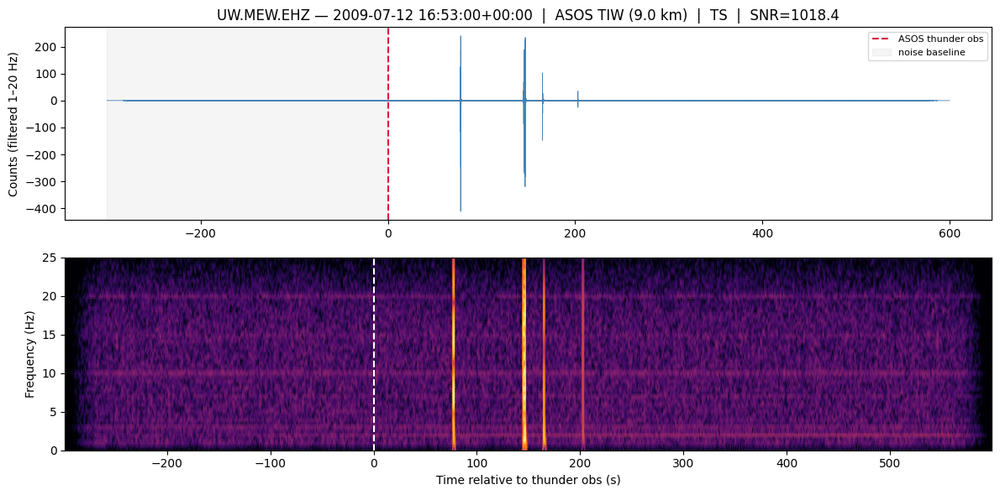

SNR=1018.4  |  peak=411  |  noise RMS=0


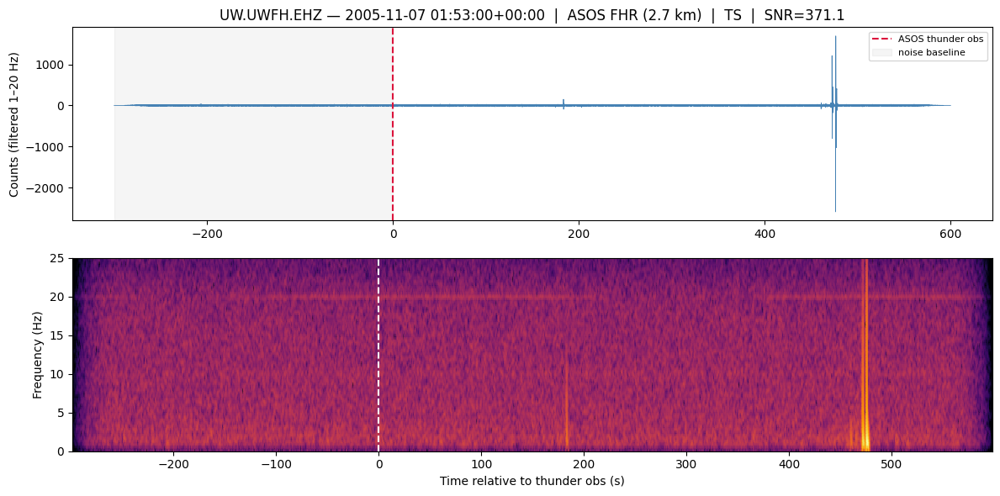

SNR=371.1  |  peak=2592  |  noise RMS=7


/home/ak287/miniconda3/envs/surface/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (20.0) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)


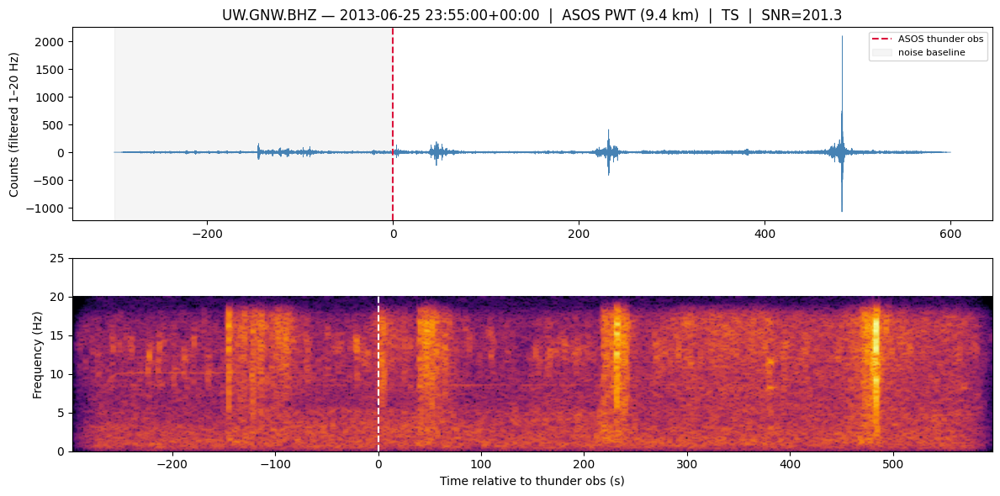

SNR=201.3  |  peak=2097  |  noise RMS=10


In [60]:
# ── Plot example waveforms for the highest-SNR detections ──────────────────
def plot_thunderquake(row, pre_min=PRE_MIN, post_min=POST_MIN):
    result = fetch_and_score(row.seismic_net, row.seismic_stn, row.time_utc)
    if result is None:
        print("No data returned")
        return

    st = result["stream"]
    tr = st[0]
    times = tr.times(reftime=UTCDateTime(row.time_utc.isoformat()))

    fig, axes = plt.subplots(2, 1, figsize=(12, 6))

    # Waveform
    axes[0].plot(times, tr.data, lw=0.6, color="steelblue")
    axes[0].axvline(0, color="crimson", lw=1.5, ls="--", label="ASOS thunder obs")
    axes[0].axvspan(-pre_min*60, 0, alpha=0.08, color="gray", label="noise baseline")
    axes[0].set(ylabel="Counts (filtered 1–20 Hz)",
                title=f"{row.seismic_net}.{row.seismic_stn}.{result['channel']} — {row.time_utc}  |  "
                      f"ASOS {row.asos_station} ({row.dist_km:.1f} km)  |  {row.wxcodes}  |  SNR={row.snr:.1f}")
    axes[0].legend(fontsize=8)

    # Spectrogram
    from scipy.signal import spectrogram as sp
    fs = tr.stats.sampling_rate
    f, t_spec, Sxx = sp(tr.data, fs=fs, nperseg=256, noverlap=200)
    t_spec_rel = t_spec - pre_min * 60
    axes[1].pcolormesh(t_spec_rel, f, 10*np.log10(Sxx + 1e-20),
                       shading="gouraud", cmap="inferno", vmin=-40)
    axes[1].axvline(0, color="white", lw=1.5, ls="--")
    axes[1].set(xlabel="Time relative to thunder obs (s)",
                ylabel="Frequency (Hz)", ylim=[0, 25])

    plt.tight_layout()
    plt.show()
    print(f"SNR={row.snr:.1f}  |  peak={row.peak_signal:.0f}  |  noise RMS={row.rms_noise:.0f}")


# Plot the top-3 detections after the catalog is built
if len(tq_cat) and tq_cat["is_thunderquake"].any():
    top = tq_cat[tq_cat["is_thunderquake"]].sort_values("snr", ascending=False).head(3)
    for row in top.itertuples(index=False):
        plot_thunderquake(row)

---
## Results analysis

Fetched windows    : 324
Detections (SNR≥3) : 300  (93%)
SNR range          : 3.1 – 1018.4
Median SNR         : 9.7


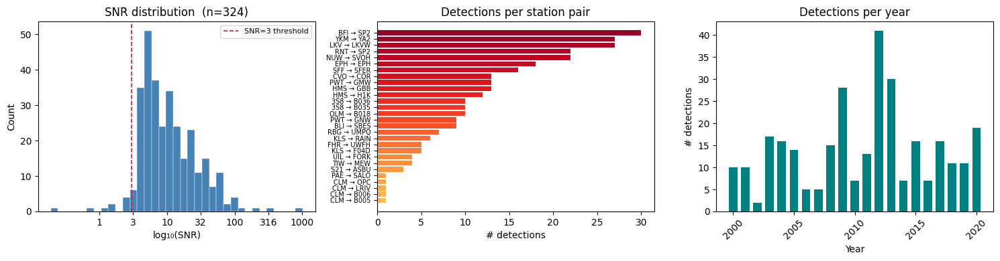


Top 10 events by SNR:
                 time_utc asos_station wxcodes seismic_stn  dist_km         snr
2009-07-12 16:53:00+00:00          TIW      TS         MEW 9.038847 1018.372166
2005-11-07 01:53:00+00:00          FHR      TS        UWFH 2.669666  371.064154
2013-06-25 23:55:00+00:00          PWT      TS         GNW 9.358934  201.302141
2015-07-03 02:55:00+00:00          LKV      TS        LKVW 7.700283  120.199473
2011-06-28 07:50:00+00:00          HMS      TS         GBB 5.199472  109.854551
2004-05-21 22:53:00+00:00          EPH      TS         EPH 8.175415  102.796253
2013-09-06 07:53:00+00:00          EPH      TS         EPH 8.175415  101.376455
2009-08-03 00:55:00+00:00          LKV      TS        LKVW 7.700283   97.649411
2015-05-26 20:53:00+00:00          EPH    TSRA         EPH 8.175415   85.277029
2005-04-23 22:56:00+00:00          YKM      TS         YA2 4.798178   79.639571


In [61]:
det   = tq_cat[tq_cat["is_thunderquake"]].sort_values("snr", ascending=False).copy()
nodet = tq_cat[~tq_cat["is_thunderquake"]].copy()

print(f"Fetched windows    : {len(tq_cat)}")
print(f"Detections (SNR≥3) : {len(det)}  ({100*len(det)/len(tq_cat):.0f}%)")
print(f"SNR range          : {det['snr'].min():.1f} – {det['snr'].max():.1f}")
print(f"Median SNR         : {det['snr'].median():.1f}")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# ── SNR distribution (log) ─────────────────────────────────────────────────
log_snr = np.log10(tq_cat["snr"].dropna())
axes[0].hist(log_snr, bins=35, color="steelblue", edgecolor="white", lw=0.3)
axes[0].axvline(np.log10(3), color="crimson", ls="--", lw=1.2, label="SNR=3 threshold")
axes[0].set(xlabel="log₁₀(SNR)", ylabel="Count",
            title=f"SNR distribution  (n={len(tq_cat)})")
axes[0].set_xticks([0, 0.5, 1, 1.5, 2, 2.5, 3])
axes[0].set_xticklabels(["1","3","10","32","100","316","1000"])
axes[0].legend(fontsize=8)

# ── Detections per ASOS–seismic station pair ───────────────────────────────
by_pair = (det.assign(label=det["asos_station"] + " → " + det["seismic_stn"])
             .groupby("label")
             .agg(n=("snr","count"), med_snr=("snr","median"))
             .sort_values("n"))
colors = plt.cm.YlOrRd(np.linspace(0.35, 0.95, len(by_pair)))
bars = axes[1].barh(by_pair.index, by_pair["n"], color=colors)
axes[1].set(xlabel="# detections", title="Detections per station pair")
axes[1].tick_params(axis="y", labelsize=7)

# ── Annual trend ───────────────────────────────────────────────────────────
det["year"] = det["time_utc"].dt.year
annual = det["year"].value_counts().sort_index()
axes[2].bar(annual.index, annual.values, color="teal", width=0.7)
axes[2].set(xlabel="Year", ylabel="# detections", title="Detections per year")
axes[2].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.savefig("../data/forward_catalog_summary.png", dpi=150)
plt.show()

print("\nTop 10 events by SNR:")
cols = ["time_utc","asos_station","wxcodes","seismic_stn","dist_km","snr"]
print(det.head(10)[cols].to_string(index=False))

## Zoomed waveforms — top detections

Three zoom levels for each event:
- **Left**: full 15-min window (5 min noise + 10 min signal)
- **Centre**: ±2 min around the ASOS observation time
- **Right**: ±30 s — individual thunder claps visible

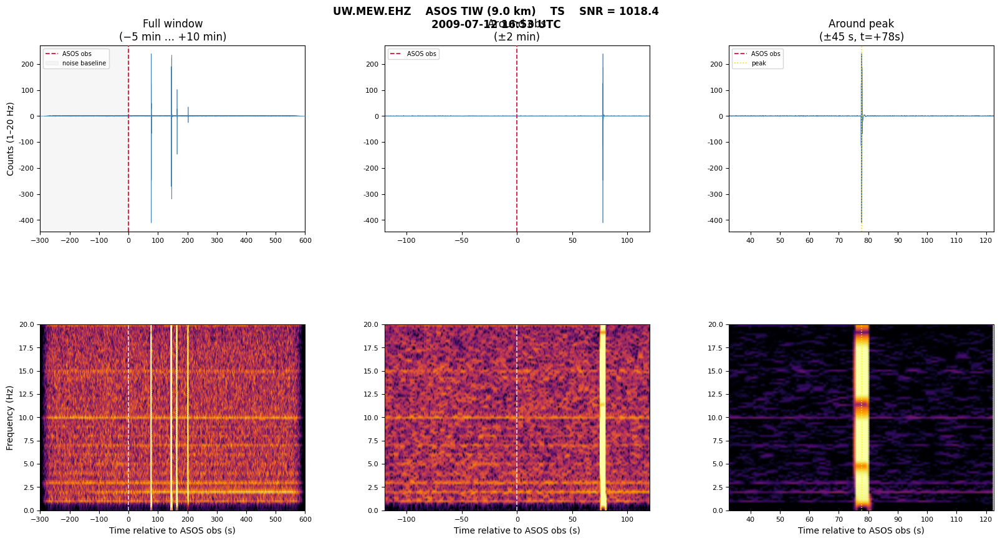

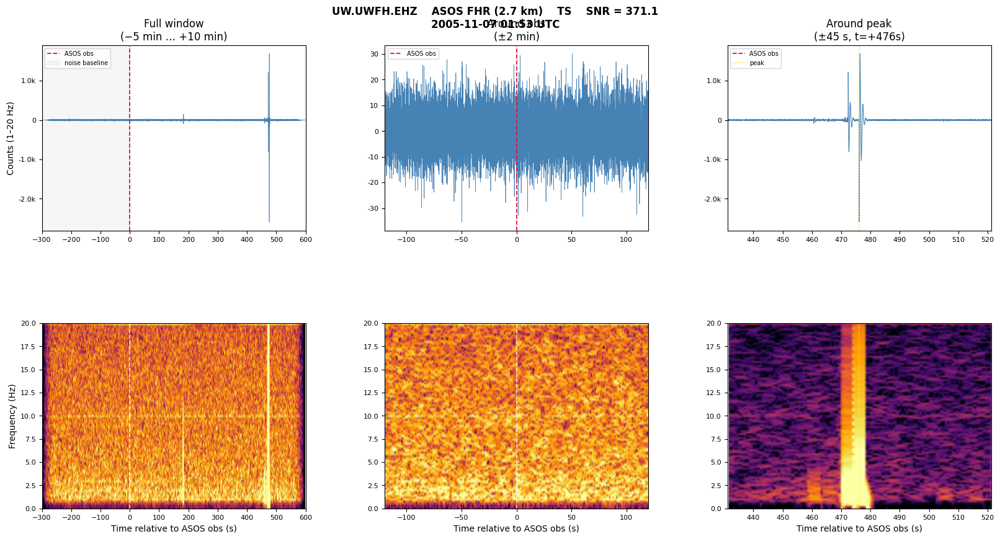

/home/ak287/miniconda3/envs/surface/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (20.0) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)


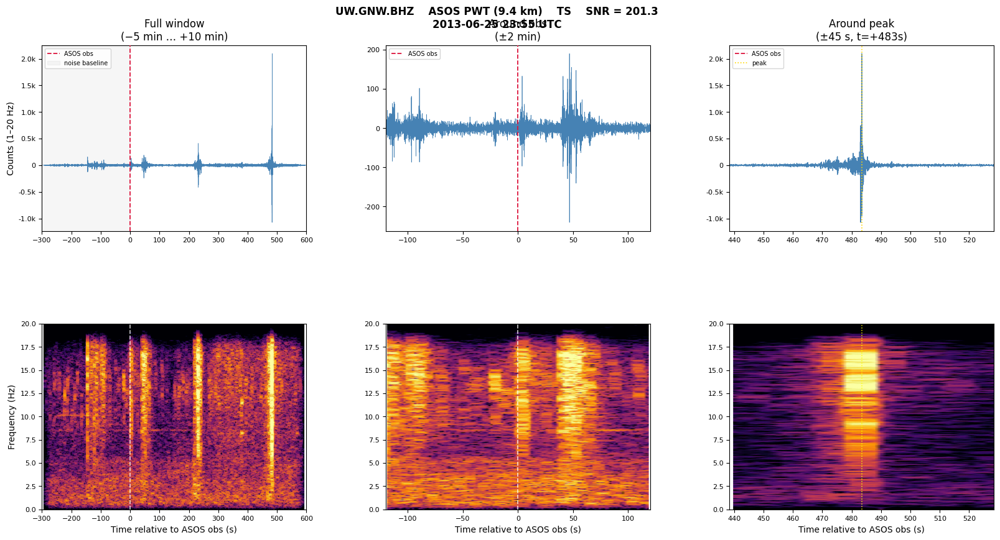

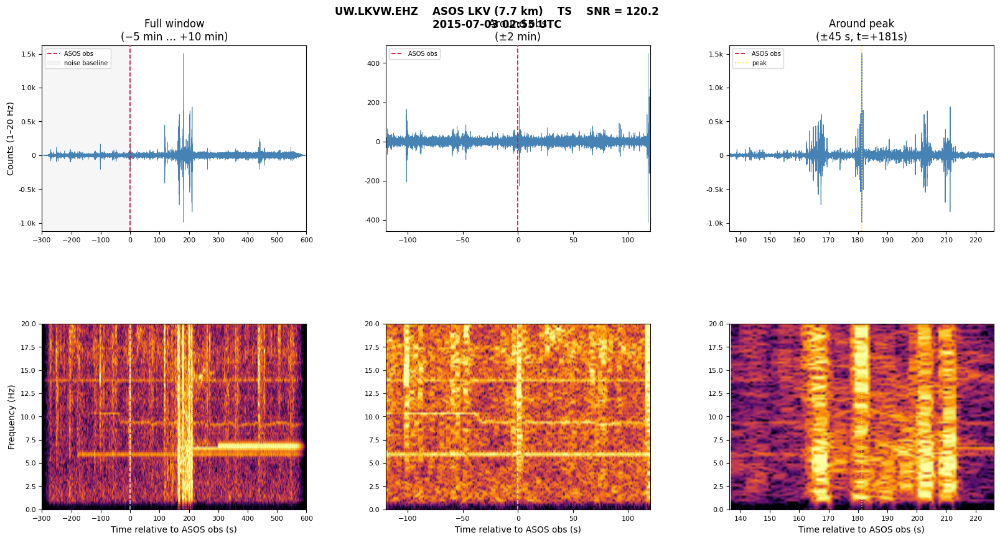

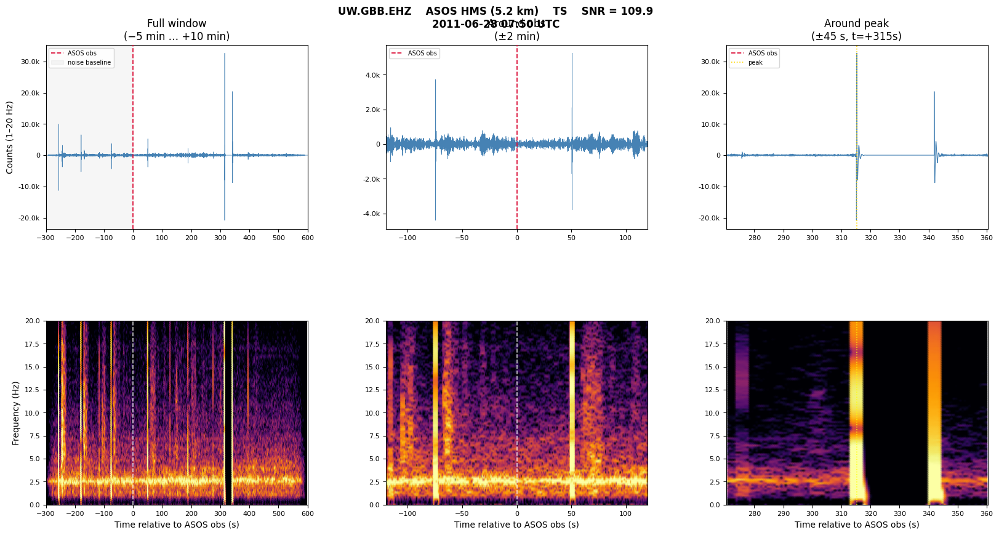

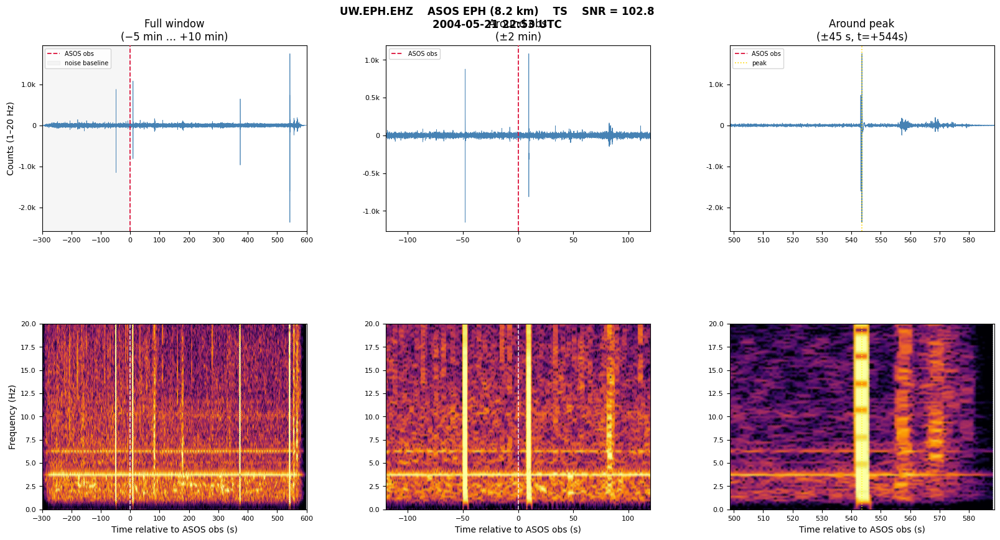

In [62]:
from scipy.signal import spectrogram as scipy_spec

CHAN_TRIES = ["HHZ", "BHZ", "EHZ", "HNZ"]

def fetch_stream(net, sta, t_thunder, pre=300, post=600):
    t0 = UTCDateTime(t_thunder.isoformat())
    for chan in CHAN_TRIES:
        try:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                st = iris.get_waveforms(net, sta, "*", chan, t0 - pre, t0 + post)
            if st:
                st.detrend("demean"); st.taper(0.05)
                st.filter("bandpass", freqmin=1.0, freqmax=20.0)
                return st, chan
        except Exception:
            continue
    return None, None


def plot_thunderquake_zoomed(row, pre_min=PRE_MIN, post_min=POST_MIN):
    st, chan = fetch_stream(row.seismic_net, row.seismic_stn, row.time_utc,
                            pre=pre_min*60, post=post_min*60)
    if st is None:
        print(f"No data: {row.seismic_net}.{row.seismic_stn}")
        return

    tr = st[0]
    fs = tr.stats.sampling_rate
    t  = tr.times(reftime=UTCDateTime(row.time_utc.isoformat()))
    d  = tr.data

    # Find peak in signal window (t > 0) for centering the tight zoom
    sig_mask  = t > 0
    peak_idx  = np.argmax(np.abs(d[sig_mask]))
    t_peak    = t[sig_mask][peak_idx]

    fig = plt.figure(figsize=(17, 9))
    fig.suptitle(
        f"UW.{row.seismic_stn}.{chan}    ASOS {row.asos_station} "
        f"({row.dist_km:.1f} km)    {row.wxcodes}    SNR = {row.snr:.1f}\n"
        f"{row.time_utc.strftime('%Y-%m-%d %H:%M UTC')}",
        fontsize=12, fontweight="bold"
    )

    gs = fig.add_gridspec(2, 3, hspace=0.50, wspace=0.30,
                          left=0.07, right=0.97, top=0.91, bottom=0.08)

    zoom_windows = [
        ("Full window\n(−5 min … +10 min)", -pre_min*60, post_min*60),
        ("Around obs\n(±2 min)",            -120,         120),
        (f"Around peak\n(±45 s, t={t_peak:+.0f}s)",
                                             t_peak - 45, t_peak + 45),
    ]

    # Pre-compute spectrogram once
    nperseg = min(512, len(d) // 8)
    f_s, t_s, Sxx = scipy_spec(d, fs=fs, nperseg=nperseg,
                                noverlap=int(nperseg * 0.85))
    t_s_rel = t_s - pre_min * 60
    Sxx_db  = 10 * np.log10(Sxx + 1e-30)

    for col, (title, x0, x1) in enumerate(zoom_windows):
        ax_w  = fig.add_subplot(gs[0, col])
        ax_sp = fig.add_subplot(gs[1, col])

        # ── Waveform ────────────────────────────────────────────────────
        m = (t >= x0) & (t <= x1)
        ax_w.plot(t[m], d[m], lw=0.5 if col < 2 else 0.8, color="steelblue")
        ax_w.axvline(0, color="crimson", lw=1.3, ls="--", label="ASOS obs", zorder=3)
        if col == 0:
            ax_w.axvspan(-pre_min*60, 0, alpha=0.07, color="gray",
                         label="noise baseline")
        if col == 2:
            ax_w.axvline(t_peak, color="gold", lw=1.2, ls=":", label="peak", zorder=3)
        ax_w.set(xlim=(x0, x1), title=title,
                 ylabel="Counts (1–20 Hz)" if col == 0 else "")
        ax_w.yaxis.set_major_formatter(
            plt.FuncFormatter(lambda v, _: f"{v/1e3:.1f}k" if abs(v) >= 500 else f"{v:.0f}"))
        ax_w.legend(fontsize=7, loc="upper left")
        ax_w.tick_params(labelsize=8)

        # ── Spectrogram ─────────────────────────────────────────────────
        sm = (t_s_rel >= x0) & (t_s_rel <= x1)
        if sm.any():
            vmax = np.percentile(Sxx_db[:, sm], 99)
            vmin = vmax - 40
            ax_sp.pcolormesh(t_s_rel[sm], f_s, Sxx_db[:, sm],
                             shading="gouraud", cmap="inferno",
                             vmin=vmin, vmax=vmax)
        ax_sp.axvline(0, color="white", lw=1.2, ls="--", alpha=0.8)
        if col == 2:
            ax_sp.axvline(t_peak, color="yellow", lw=1.1, ls=":", alpha=0.9)
        ax_sp.set(xlim=(x0, x1), ylim=(0, min(20, fs / 2)),
                  ylabel="Frequency (Hz)" if col == 0 else "",
                  xlabel="Time relative to ASOS obs (s)")
        ax_sp.tick_params(labelsize=8)

    fname = f"../data/tq_{row.seismic_stn}_{row.time_utc.strftime('%Y%m%dT%H%M')}.png"
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()


# Plot top 6
for row in det.head(6).itertuples(index=False):
    plot_thunderquake_zoomed(row)

## Detailed seismic signature

For the best event (TIW→MEW, SNR=1018) we decompose into frequency sub-bands
and compute the signal envelope to reveal the thunder clap structure.
Thunder coupling is broadband (1–20 Hz) but each individual clap shows an
emergent onset and ~10–30 s duration — very different from an earthquake's
sharp P-wave arrival.

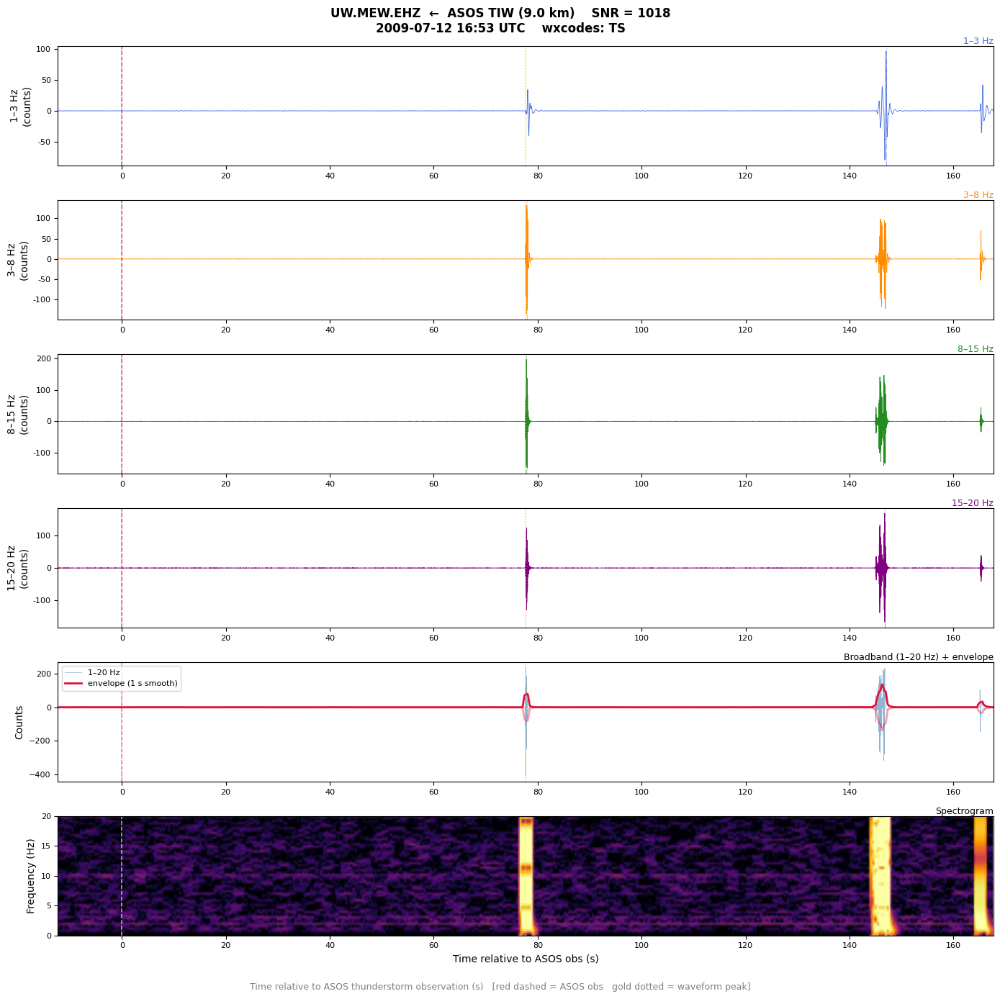

In [63]:
from scipy.signal import hilbert
from obspy.signal.filter import bandpass

best = det.iloc[0]   # TIW → MEW, SNR=1018

# Fetch raw (unfiltered) for custom band decomposition
t0_best = UTCDateTime(best.time_utc.isoformat())
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    st_raw = iris.get_waveforms("UW", "MEW", "*", "EHZ",
                                t0_best - 300, t0_best + 600)
st_raw.detrend("demean"); st_raw.taper(0.05)
tr_raw = st_raw[0]
fs  = tr_raw.stats.sampling_rate
d0  = tr_raw.data.copy()
t   = tr_raw.times(reftime=t0_best)

# ── Frequency-band decomposition ────────────────────────────────────────────
bands = [
    ("1–3 Hz",   1,  3,  "royalblue"),
    ("3–8 Hz",   3,  8,  "darkorange"),
    ("8–15 Hz",  8, 15,  "forestgreen"),
    ("15–20 Hz",15, 20,  "purple"),
]
filtered = {}
for label, flo, fhi, _ in bands:
    fhi_safe = min(fhi, fs/2 - 0.5)
    filtered[label] = bandpass(d0.astype(float), flo, fhi_safe, fs, corners=4)

# ── Envelope of broadband signal ────────────────────────────────────────────
d_broad = bandpass(d0.astype(float), 1.0, min(20, fs/2 - 0.5), fs, corners=4)
envelope = np.abs(hilbert(d_broad))
# Smooth envelope over 1-second windows
from scipy.ndimage import uniform_filter1d
env_smooth = uniform_filter1d(envelope, size=int(fs))

# Focus on peak region (±90 s around peak at t≈+78 s)
T_PEAK = 77.7
ZOOM   = 90

fig, axes = plt.subplots(len(bands) + 2, 1, figsize=(14, 14), sharex=False)
fig.suptitle(
    f"UW.MEW.EHZ  ←  ASOS TIW (9.0 km)    SNR = {best.snr:.0f}\n"
    f"{best.time_utc.strftime('%Y-%m-%d %H:%M UTC')}    wxcodes: {best.wxcodes}",
    fontsize=12, fontweight="bold"
)

x0, x1 = T_PEAK - ZOOM, T_PEAK + ZOOM
m = (t >= x0) & (t <= x1)

# ── Stacked band-pass waveforms ─────────────────────────────────────────────
for i, (label, flo, fhi, color) in enumerate(bands):
    ax = axes[i]
    fd = filtered[label][m]
    ax.plot(t[m], fd, lw=0.6, color=color)
    ax.axvline(0,       color="crimson", lw=1.1, ls="--", alpha=0.7)
    ax.axvline(T_PEAK,  color="gold",    lw=1.1, ls=":",  alpha=0.9)
    peak_here = t[m][np.argmax(np.abs(fd))]
    ax.axvline(peak_here, color=color, lw=0.8, ls="-.", alpha=0.5)
    ax.set(xlim=(x0, x1), ylabel=f"{label}\n(counts)")
    ax.yaxis.set_major_formatter(
        plt.FuncFormatter(lambda v, _: f"{v:.0f}"))
    ax.tick_params(labelsize=8)
    ax.set_title(label, fontsize=9, loc="right", pad=2, color=color)

# ── Broadband + envelope ─────────────────────────────────────────────────────
ax_env = axes[len(bands)]
ax_env.plot(t[m], d_broad[m], lw=0.5, color="steelblue", alpha=0.6, label="1–20 Hz")
ax_env.plot(t[m], env_smooth[m],  lw=2.0, color="crimson",   label="envelope (1 s smooth)")
ax_env.plot(t[m], -env_smooth[m], lw=2.0, color="crimson",   alpha=0.4)
ax_env.axvline(0,      color="crimson", lw=1.1, ls="--", alpha=0.5)
ax_env.axvline(T_PEAK, color="gold",    lw=1.1, ls=":",  alpha=0.9)
ax_env.set(xlim=(x0, x1), ylabel="Counts")
ax_env.legend(fontsize=8, loc="upper left")
ax_env.set_title("Broadband (1–20 Hz) + envelope", fontsize=9, loc="right", pad=2)
ax_env.tick_params(labelsize=8)

# ── Spectrogram ──────────────────────────────────────────────────────────────
ax_sp = axes[len(bands) + 1]
nperseg = 256
f_s, t_s, Sxx = scipy_spec(d_broad, fs=fs, nperseg=nperseg,
                            noverlap=int(nperseg * 0.88))
t_s_rel = t_s - 300   # relative to ASOS obs
sm = (t_s_rel >= x0) & (t_s_rel <= x1)
if sm.any():
    vmax = np.percentile(10*np.log10(Sxx[:, sm]+1e-30), 99)
    ax_sp.pcolormesh(t_s_rel[sm], f_s, 10*np.log10(Sxx[:, sm]+1e-30),
                     shading="gouraud", cmap="inferno",
                     vmin=vmax-45, vmax=vmax)
ax_sp.axvline(0,      color="white", lw=1.1, ls="--", alpha=0.7)
ax_sp.axvline(T_PEAK, color="yellow", lw=1.1, ls=":", alpha=0.9)
ax_sp.set(xlim=(x0, x1), ylim=(0, 20),
          ylabel="Frequency (Hz)", xlabel="Time relative to ASOS obs (s)")
ax_sp.set_title("Spectrogram", fontsize=9, loc="right", pad=2)
ax_sp.tick_params(labelsize=8)

# Shared x-label annotation
for ax in axes[:-1]:
    ax.set_xlabel("")
# Red dashed = ASOS obs time; gold dotted = signal peak
for ax in axes:
    ax.axvline(0,      color="crimson", lw=0.8, ls="--", alpha=0.35, zorder=0)
    ax.axvline(T_PEAK, color="gold",    lw=0.8, ls=":",  alpha=0.35, zorder=0)

fig.text(0.5, 0.005,
         "Time relative to ASOS thunderstorm observation (s)   "
         "[red dashed = ASOS obs   gold dotted = waveform peak]",
         ha="center", fontsize=9, color="gray")

plt.tight_layout(rect=[0, 0.02, 1, 1])
plt.savefig("../data/tq_MEW_detailed_signature.png", dpi=150, bbox_inches="tight")
plt.show()